In [1]:
import os
import cv2
import math
import pafy
import random
import numpy as np
import datetime as dt
import tensorflow as tf
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline
 
from sklearn.model_selection import train_test_split
 
from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model
from tensorflow.keras.applications import VGG19
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Dropout, BatchNormalization, Activation
from tensorflow.keras.models import Model


In [2]:
seed_constant = 23
np.random.seed(seed_constant)
random.seed(seed_constant)
tf.random.set_seed(seed_constant)

['Discuss', 'Examination', 'Knowledge', 'Learn', 'Memorize', 'School', 'Student', 'Teacher', 'Uniform', 'Write']


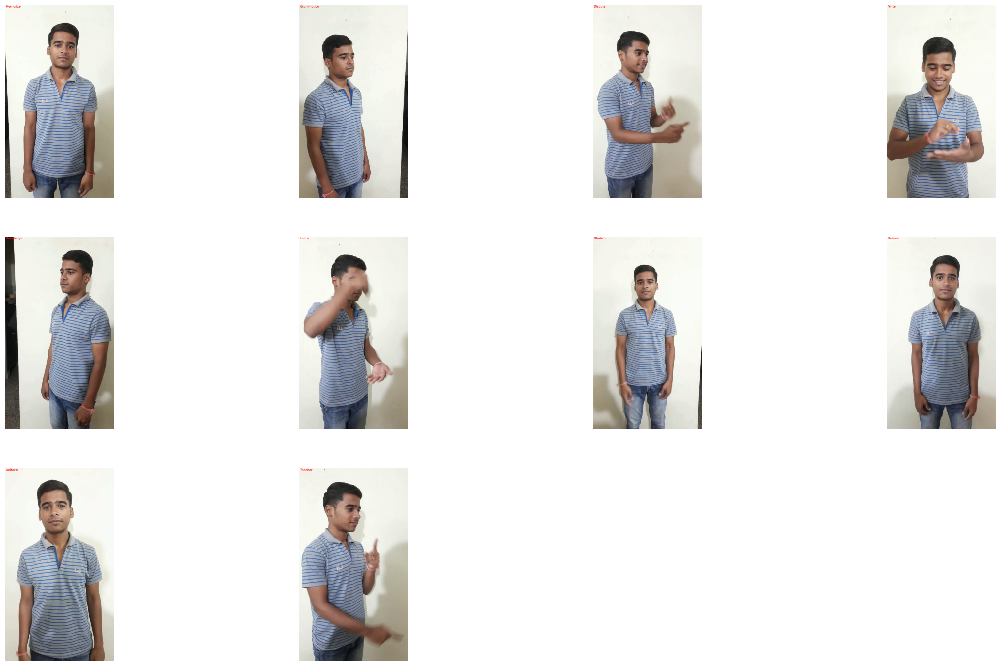

In [3]:
# Create a Matplotlib figure
plt.figure(figsize = (30, 30))
 
# Get Names of all classes in UCF50
all_classes_names = os.listdir('Dataset/train')
print(all_classes_names)
 
# Generate a random sample of images each time the cell runs
num_samples = 10
random_range = random.sample(range(len(all_classes_names)), num_samples)
 
# Iterating through all the random samples
for counter, random_index in enumerate(random_range, 1):
 
    # Getting Class Name using Random Index
    selected_class_Name = all_classes_names[random_index]
 
    # Getting a list of all the video files present in a Class Directory
    video_files_names_list = os.listdir(f'Dataset/train/{selected_class_Name}')
 
    # Randomly selecting a video file
    selected_video_file_name = random.choice(video_files_names_list)
 
    # Reading the Video File Using the Video Capture
    video_reader = cv2.VideoCapture(f'Dataset/train/{selected_class_Name}/{selected_video_file_name}')
     
    # Reading The First Frame of the Video File
    _, bgr_frame = video_reader.read()
 
    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()
 
    # Converting the BGR Frame to RGB Frame 
    rgb_frame = cv2.cvtColor(bgr_frame, cv2.COLOR_BGR2RGB)
 
    # Adding The Class Name Text on top of the Video Frame.
    cv2.putText(rgb_frame, selected_class_Name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
     
    # Assigning the Frame to a specific position of a subplot
    plt.subplot(5, 4, counter)
    plt.imshow(rgb_frame)
    plt.axis('off')

## Read and Preprocess the Dataset

 image_height and image_weight: This is the size we will resize all frames of the video to, we are doing this to avoid unnecessary computation.
 
max_images_per_class: Maximum number of training images allowed for each class
 
dataset_directory: The path of the directory containing the extracted dataset.

In [4]:
image_height, image_width = 64, 64
max_images_per_class = 1000
 
dataset_directory = "Dataset/train"
classes_list = ['Discuss', 'Examination', 'Knowledge', 'Learn', 'Memorize', 'School', 'Student', 'Teacher', 'Uniform', 'Write']
 
model_output_size = len(classes_list)

## Extract, Resize and Normalize Frames

Now we will create a function that will extract frames from each video while performing other preprocessing operation like resizing and normalizing images.

This method takes a video file path as input. It then reads the video file frame by frame, resizes each frame, normalizes the resized frame, appends the normalized frame into a list, and then finally returns that list.

In [5]:
def imagearray(path, size):
    
    img_arr=cv2.imread(path)
    img_arr=cv2.resize(img_arr, size)
         
    return data

In [6]:
def frames_extraction(video_path):
    # Empty List declared to store video frames
    frames_list = []
     
    # Reading the Video File Using the VideoCapture
    video_reader = cv2.VideoCapture(video_path)
 
    # Iterating through Video Frames
    while True:
 
        # Reading a frame from the video file 
        success, frame = video_reader.read() 
 
        # If Video frame was not successfully read then break the loop
        if not success:
            break
 
        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
         
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
         
        # Appending the normalized frame into the frames list
        frames_list.append(normalized_frame)
     
    # Closing the VideoCapture object and releasing all resources. 
    video_reader.release()
 
    # returning the frames list 
    return frames_list

## Dataset Creation

- Iterate through all the classes mentioned in the classes_list
- Now for each class iterate through all the video files present in it.
- Call the frame_extraction method on each video file.
- Add the returned frames to a list called temp_features
- After all videos of a class are processed, randomly select video frames (equal to max_images_per_class) and add them to the list called features.
- Add labels of the selected videos to the `labels` list.
- After all videos of all classes are processed then return the features and labels as NumPy arrays.

In [7]:
def create_dataset():
 
    # Declaring Empty Lists to store the features and labels values.
    temp_features = [] 
    features = []
    labels = []
     
    # Iterating through all the classes mentioned in the classes list
    for class_index, class_name in enumerate(classes_list):
        print(f'Extracting Data of Class: {class_name}')
         
        # Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(dataset_directory, class_name))
 
        # Iterating through all the files present in the files list
        for file_name in files_list:
 
            # Construct the complete video path
            video_file_path = os.path.join(dataset_directory, class_name, file_name)
 
            # Calling the frame_extraction method for every video file path
            frames = frames_extraction(video_file_path)
 
            # Appending the frames to a temporary list.
            temp_features.extend(frames)
         
        # Adding randomly selected frames to the features list
        features.extend(random.sample(temp_features, max_images_per_class))
 
        # Adding Fixed number of labels to the labels list
        labels.extend([class_index] * max_images_per_class)
         
        # Emptying the temp_features list so it can be reused to store all frames of the next class.
        temp_features.clear()
 
    # Converting the features and labels lists to numpy arrays
    features = np.asarray(features)
    labels = np.array(labels)  
 
    return features, labels

In [8]:
features, labels = create_dataset()

Extracting Data of Class: Discuss
Extracting Data of Class: Examination
Extracting Data of Class: Knowledge
Extracting Data of Class: Learn
Extracting Data of Class: Memorize
Extracting Data of Class: School
Extracting Data of Class: Student
Extracting Data of Class: Teacher
Extracting Data of Class: Uniform
Extracting Data of Class: Write


#### Converting Labels to hot encoder

In [9]:
# Using Keras's to_categorical method to convert labels into one-hot-encoded vectors
one_hot_encoded_labels = to_categorical(labels)

In [10]:
features_train, features_test, labels_train, labels_test = train_test_split(features, one_hot_encoded_labels, test_size = 0.2, shuffle = True, random_state = seed_constant)


In [11]:
# Let's create a function that will construct our model
def create_model():
 
    vgg = VGG19(input_shape = (64, 64, 3), weights = 'imagenet', include_top = False)
    
    for layer in vgg.layers:
        layer.trainable = False

    x = Flatten()(vgg.output)
    prediction = Dense(10, activation='softmax')(x)

    model = Model(inputs=vgg.input, outputs=prediction)
    model.summary()
    model.compile(
    loss='sparse_categorical_crossentropy',
    optimizer="adam",
    metrics=['accuracy']
    )
 
    return model
 
 
# Calling the create_model method
model = create_model()
 
print("Model Created Successfully!")

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 block1_conv1 (Conv2D)       (None, 64, 64, 64)        1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 64, 64, 64)        36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 32, 32, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 32, 32, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 32, 32, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 16, 16, 128)       0     

In [14]:
# Adding Early Stopping Callback
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
 
# Adding loss, optimizer and metrics values to the model.
model.compile(loss = 'categorical_crossentropy', optimizer = 'Adam', metrics = ["accuracy"])
 
# Start Training
model_training_history = model.fit(x = features_train, y = labels_train, epochs = 20, batch_size = 4 , shuffle = True, validation_split = 0.2, callbacks = [early_stopping_callback])

Epoch 1/20
1600/1600 [==============================] - 92s 57ms/step - loss: 0.7340 - accuracy: 0.8106 - val_loss: 0.3125 - val_accuracy: 0.9494
Epoch 2/20
1600/1600 [==============================] - 111s 69ms/step - loss: 0.1852 - accuracy: 0.9770 - val_loss: 0.1109 - val_accuracy: 0.9931
Epoch 3/20
1600/1600 [==============================] - 113s 70ms/step - loss: 0.0890 - accuracy: 0.9923 - val_loss: 0.0641 - val_accuracy: 0.9956
Epoch 4/20
1600/1600 [==============================] - 118s 74ms/step - loss: 0.0501 - accuracy: 0.9962 - val_loss: 0.0386 - val_accuracy: 0.9969
Epoch 5/20
1600/1600 [==============================] - 119s 74ms/step - loss: 0.0290 - accuracy: 0.9994 - val_loss: 0.0295 - val_accuracy: 0.9987
Epoch 6/20
1600/1600 [==============================] - 117s 73ms/step - loss: 0.0186 - accuracy: 0.9994 - val_loss: 0.0163 - val_accuracy: 0.9994
Epoch 7/20
1600/1600 [==============================] - 120s 75ms/step - loss: 0.0122 - accuracy: 0.9998 - val_loss: 0.

In [15]:
model_evaluation_history = model.evaluate(features_test, labels_test)

63/63 [==============================] - 24s 379ms/step - loss: 0.0067 - accuracy: 0.9990


In [16]:
# Creating a useful name for our model, incase you're saving multiple models (OPTIONAL)
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
model_name = f'Model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'
 
# Saving your Model
model.save(model_name)

In [17]:
def plot_metric(metric_name_1, metric_name_2, plot_name):
  # Get Metric values using metric names as identifiers
  metric_value_1 = model_training_history.history[metric_name_1]
  metric_value_2 = model_training_history.history[metric_name_2]
 
  # Constructing a range object which will be used as time 
  epochs = range(len(metric_value_1))
   
  # Plotting the Graph
  plt.plot(epochs, metric_value_1, 'blue', label = metric_name_1)
  plt.plot(epochs, metric_value_2, 'red', label = metric_name_2)
   
  # Adding title to the plot
  plt.title(str(plot_name))
 
  # Adding legend to the plot
  plt.legend()

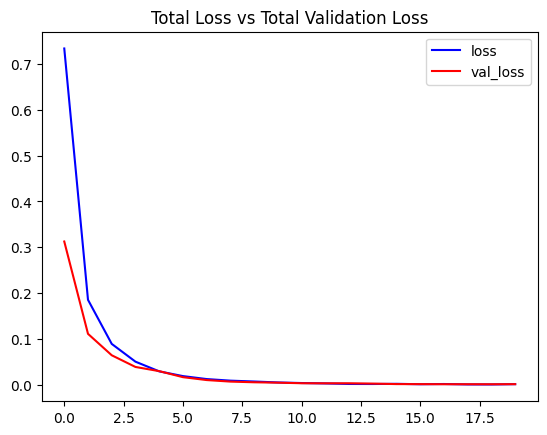

In [18]:
plot_metric('loss', 'val_loss', 'Total Loss vs Total Validation Loss')

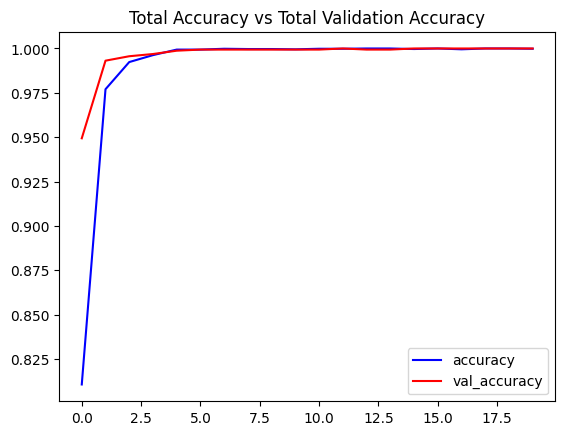

In [19]:
plot_metric('accuracy', 'val_accuracy', 'Total Accuracy vs Total Validation Accuracy')

In [20]:
def predict_on_live_video(video_file_path, output_file_path, window_size):
    classes=[]
 
    # Initialize a Deque Object with a fixed size which will be used to implement moving/rolling average functionality.
    predicted_labels_probabilities_deque = deque(maxlen = window_size)
 
    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)
 
    # Getting the width and height of the video 
    original_video_width = int(video_reader.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_video_height = int(video_reader.get(cv2.CAP_PROP_FRAME_HEIGHT))
 
    # Writing the Overlayed Video Files Using the VideoWriter Object
    video_writer = cv2.VideoWriter(output_file_path, cv2.VideoWriter_fourcc('M', 'P', '4', 'V'), 24, (original_video_width, original_video_height))
 
    while True: 
 
        # Reading The Frame
        status, frame = video_reader.read() 
 
        if not status:
            break
 
        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
         
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
 
        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]
 
        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_deque.append(predicted_labels_probabilities)
 
        # Assuring that the Deque is completely filled before starting the averaging process
        if len(predicted_labels_probabilities_deque) == window_size:
 
            # Converting Predicted Labels Probabilities Deque into Numpy array
            predicted_labels_probabilities_np = np.array(predicted_labels_probabilities_deque)
 
            # Calculating Average of Predicted Labels Probabilities Column Wise 
            predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)
 
            # Converting the predicted probabilities into labels by returning the index of the maximum value.
            predicted_label = np.argmax(predicted_labels_probabilities_averaged)
 
            # Accessing The Class Name using predicted label.
            predicted_class_name = classes_list[predicted_label]
            classes.append(predicted_class_name)
           
            # Overlaying Class Name Text Ontop of the Frame
            cv2.putText(frame, predicted_class_name, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0, 0, 255), 2)
 
        # Writing The Frame
        video_writer.write(frame)
 
 
        # cv2.imshow('Predicted Frames', frame)
 
        # key_pressed = cv2.waitKey(10)
 
        # if key_pressed == ord('q'):
        #     break
 
    # cv2.destroyAllWindows()
 
     
    # Closing the VideoCapture and VideoWriter objects and releasing all resources held by them. 
    video_reader.release()
    video_writer.release()
    return classes

In [27]:
# Creating The Output directories if it does not exist
output_directory = 'Youtube_Videos'
os.makedirs(output_directory, exist_ok = True)
 
# Downloading a YouTube Video
#video_title = download_youtube_videos('https://youtu.be/uT8WGjPj-V8', output_directory)
 
# Getting the YouTube Video's path you just downloaded
input_video_file_path = f'Youtube_Videos/Examination1.mp4'

In [28]:
cl = []

In [29]:
# Setting the Window Size which will be used by the Rolling Average Process
window_size = 25
 
# Constructing The Output YouTube Video Path
output_video_file_path = f'Youtube_Videos/testing -Output-WSize {window_size}.mp4'
 
# Calling the predict_on_live_video method to start the Prediction and Rolling Average Process
#cl.append(predict_on_live_video(input_video_file_path, output_video_file_path, window_size))

cl.append(predict_on_live_video(input_video_file_path,output_video_file_path , window_size))

 
# Play Video File in the Notebook
VideoFileClip(f'Youtube_Videos/testing -Output-WSize {window_size}.mp4').ipython_display(width = 700)

1/1 [==============================] - 0s 61ms/step
Moviepy - Building video __temp__.mp4.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
